In [10]:
import os
BASE_PATH=(os.sep).join(os.getcwd().split(os.sep)[:os.getcwd().split(os.sep).index('Ayna_Generative_AI_Assignment')+1])

### Selecting a random prompt image

In [8]:
import random
random.seed(0)

In [11]:
PATH_TO_PROMPTS_TXT=os.path.join(BASE_PATH,'prompts_for_img_generation.txt')

In [16]:
def read_prompt(FILE_PATH):
    with open(FILE_PATH, 'r') as f:
        data=f.read()
    data=data.split('\n')
    data = list(filter(None, data))
    return data

def return_random_prompt(data):
    return data[random.randint(0, len(data))]

prompt=return_random_prompt(read_prompt(PATH_TO_PROMPTS_TXT))
prompt

'A gardener pruning roses in a vibrant garden full of colorful flowers and greenery.'

### Generate a Basic Image

In [17]:
import torch
from diffusers import StableDiffusionPipeline

In [18]:
model_id = "CompVis/stable-diffusion-v1-4"
device = "cuda"

In [22]:
def load_pipe_text_to_image():
    pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float32)
    return pipe
pipe=load_pipe_text_to_image()

def text_to_image_pipe(pipe, prompt):
    images = pipe(prompt=prompt).images[0]
    return images
image=text_to_image_pipe(pipe, prompt)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

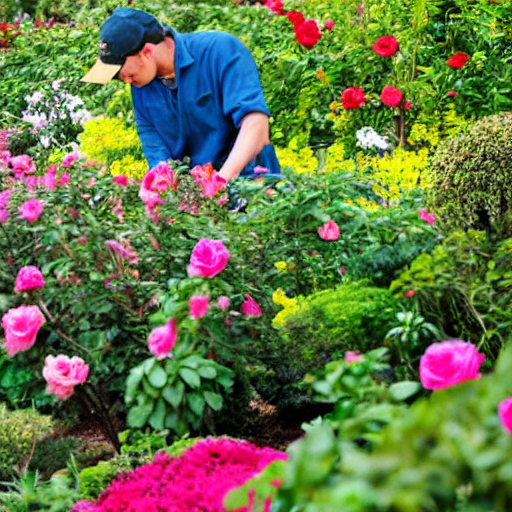

In [23]:
image

In [27]:
print('Current image Shape: - ', image.size)

Current image Shape: -  (512, 512)


Since our current image size is 512*512, we need to scale it 4 times to achieve the desired 2048*2048 results

In [30]:
scale_factor = 4  # Change scale factor based on your needs

### Method-1 -: Using PIL for Basic Interploation

In [31]:
from PIL import Image

In [33]:
def upscale_image(img, scale_factor):
    new_size = (int(img.width * scale_factor), int(img.height * scale_factor))
    # Resize the image using BICUBIC interpolation
    upscaled_img = img.resize(new_size, Image.BICUBIC)
        
    return upscaled_img
scaled_image=upscale_image(image, scale_factor)

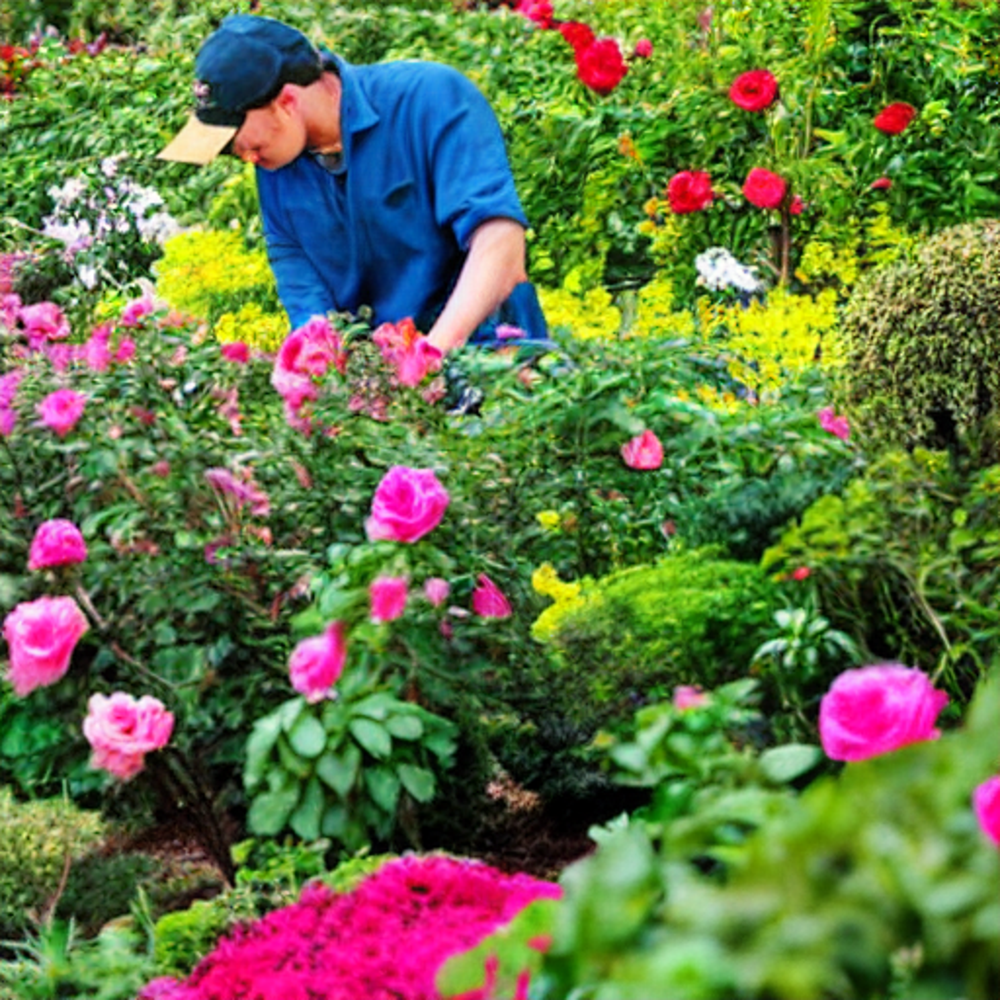

In [41]:
scaled_image

In [42]:
print(scaled_image.size)

(2048, 2048)


### Method 2: Using Deep Learning Models (ESRGAN)

In [75]:
# ! pip install basicsr

In [74]:
# # ! pip install git+https://github.com/leverxgroup/esrgan.git
# ! pip install numpy opencv-python

In [73]:
# import os.path as osp
# import glob
# import cv2
# import numpy as np
# import torch
# import RRDBNet_arch as arch

In [69]:
# def load_model(model_path):
#     """Load the pre-trained ESRGAN model."""
#     model = arch.RRDBNet(3, 3, 64, 23, gc=32)
#     model.load_state_dict(torch.load(model_path), strict=True)
#     model.eval()
#     model = model.to(device)

# model_path = './RRDB_PSNR_x4.pth'  # Path to the model weights
# model = load_model(model_path)


In [70]:

# def upscale_image_esrgan(image, model):
#     device = next(model.parameters()).device
#     # Load image and convert to tensor
#     img = image
#     img_tensor = img2tensor(img, bgr2rgb=True, float32=True).unsqueeze(0).to(device)
    
#     # Generate high-resolution image
#     with torch.no_grad():
#         output = model(img_tensor)
    
#     # Convert output tensor to image
#     output_img = tensor2img(output, rgb2bgr=True, min_max=(0, 1))
#     output_img = Image.fromarray(output_img)
    
#     return output_img

In [71]:
# device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [72]:

# input_path = 'low_res_image.png'
# output_path = 'high_res_image.png'
# upscale_image_esrgan(input_path, output_path, model)

#### Method-3 : - Using LLM EDSR

In [ ]:
# ! pip install super-image

In [62]:
import torch
from super_image import EdsrModel, ImageLoader
from PIL import Image
from torchvision import transforms

In [64]:
def load_image_resolution_model():
    model = EdsrModel.from_pretrained('eugenesiow/edsr-base', scale=2)      # scale 2, 3 and 4 models available
    return model
model=load_image_resolution_model()

def enhance_image_res(model, image):
    inputs = ImageLoader.load_image(image)
    preds = model(inputs)
    return preds

def return_image_from_tensor(image_pred):
    tensor_image = image_pred[0].to('cpu')
    # Convert the tensor image to a PIL image
    pil_image = transforms.ToPILImage()(tensor_image)
    return pil_image

/home/vchopra/anaconda3/lib/python3.11/site-packages/huggingface_hub/file_download.py:669: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


https://huggingface.co/eugenesiow/edsr-base/resolve/main/pytorch_model_2x.pt


/home/vchopra/anaconda3/lib/python3.11/site-packages/super_image/data/loader.py:14: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  return torch.as_tensor([lr])


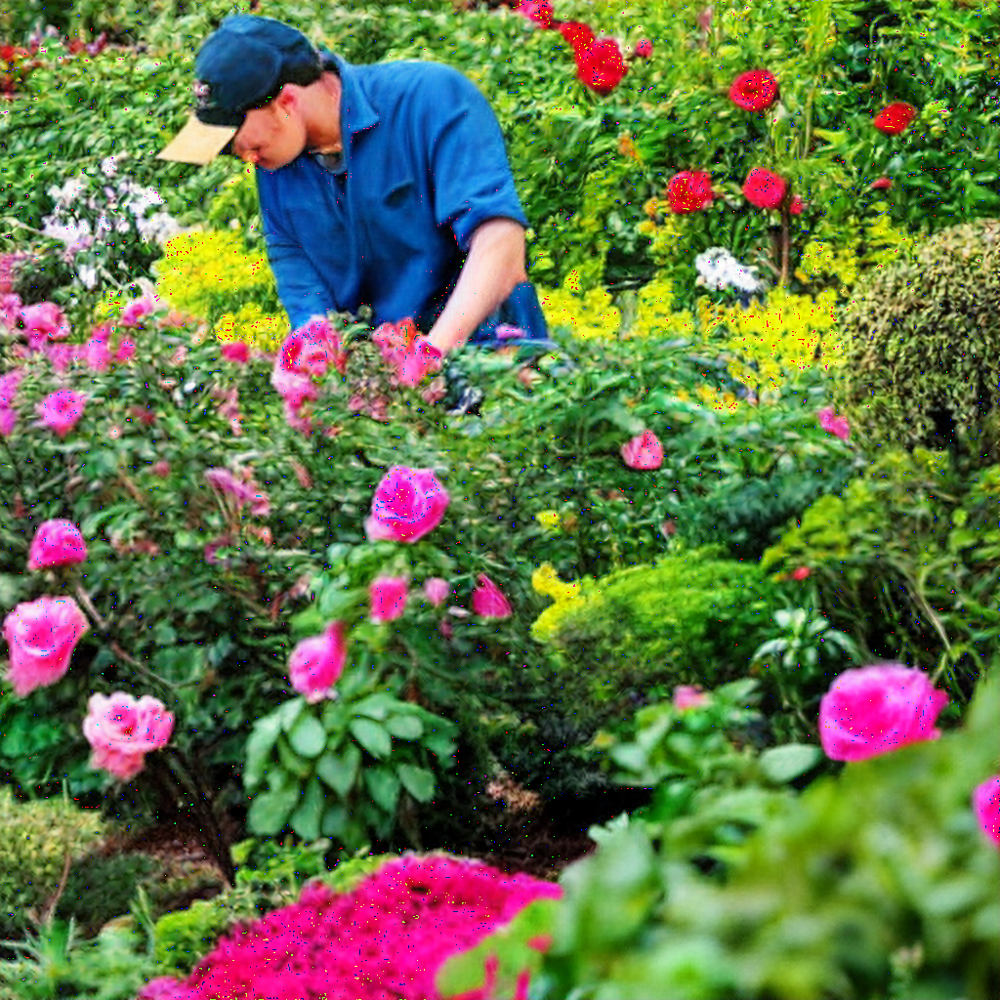

In [66]:
enhanced_image=return_image_from_tensor(enhance_image_res(model, image))
enhanced_image

In [68]:
enhanced_image.size

(1024, 1024)

In [ ]:
preds = model(inputs)
preds.shape

In [ ]:
from torchvision import transforms
# Move the tensor image to CPU
tensor_image = preds[0].to('cpu')

# Convert the tensor image to a PIL image
pil_image = transforms.ToPILImage()(tensor_image)

In [ ]:
pil_image

In [ ]:
ImageLoader.save_image(preds, './scaled_2x.png')                        # save the output 2x scaled image to `./scaled_2x.png`

In [ ]:
ImageLoader.save_compare(inputs, preds, './scaled_2x_compare.png')      # save an output comparing the super-image with a bicubic scaling